# Modeling

PyMC resources:
- on BIC: https://www.pymc.io/projects/examples/en/latest/diagnostics_and_criticism/Bayes_factor.html
- on out-of-sample predictions: https://www.pymc.io/projects/examples/en/latest/generalized_linear_models/GLM-out-of-sample-predictions.html
- on model comparison: https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/model_comparison.html
- on TMCMC: https://www.pymc.io/projects/examples/en/latest/samplers/SMC2_gaussians.html

## Imports and Data Preprocessing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import arviz as az
import pymc as pm
from zipfile import ZipFile
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay, auc, roc_curve

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)

In [3]:
## PREPROCESS SIMPLE MODEL
# read in data
zip_file = ZipFile("data/adult23csv.zip")

df_full = pd.read_csv(zip_file.open('adult23.csv'))
y_name = 'LONGCOVD1_A'

def preprocess_simple_model(df_full):
    feat_names = ["AGEP_A", "SEX_A", "SHTCVD191_A", "LONGCOVD1_A"]
    
    # subset for features and drop null values
    df = df_full.loc[:, feat_names].dropna(subset=y_name)
    df = df[df[y_name] != 9]
    print("Shape after feature selection and dropping lcovid nulls:",df.shape)
    
    # FIX ATTRIBUTES
    df["SEX_A"] = (df["SEX_A"] == 1) * 1  # 1 is male 
    df["SHTCVD191_A"] = (df["SHTCVD191_A"] == 1) * 1  # 1 is yes covid shot
    
    # split X and y
    X = df.loc[:, df.columns != y_name]
    y = df.loc[:, y_name]
    y = (y == 1) * 1 # encode as 0 / 1 values
    
    # train test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=207)
    return X_train, X_test, y_train, y_test

In [4]:
## PREPROCESSING LITERATURE FEATURES
def preprocess_lit_features(df_full):
    from sklearn.preprocessing import OneHotEncoder, StandardScaler
    
    lit_feats = ["SEX_A", "DIBEV_A", "AGEP_A", "BMICAT_A", 
                 "COGMEMDFF_A", "SHTCVD191_A", "SHTCVD19NM1_A", 
                 "SHOTTYPE2_A", "HISPALLP_A"]
    df_lit = df_full[lit_feats].fillna(-1)
    df_lit[y_name] = df_full[y_name]
    df_lit = df_lit.dropna(subset=y_name)
    df_lit = df_lit[df_lit[y_name] != 9]
    # # make age > 84 as -1 category
    # df_lit.loc[:,"AGEP_A"].loc[df_lit.loc[:,"AGEP_A"] > 84] = 85
    
    encoder = OneHotEncoder(drop='first', sparse_output=False).set_output(transform="pandas")
    scaler = StandardScaler().set_output(transform="pandas")
    
    X = df_lit.drop(columns=y_name)
    
    # define continuous and categorical features
    continuous = X.columns[X.apply(np.unique).apply(len) > 15] 
    categorical = X.columns[~X.columns.isin(continuous)]
    
    # scale and encode
    cont_df =  scaler.fit_transform(X.loc[:, continuous])
    cat_df = encoder.fit_transform(X.loc[:,categorical])
    
    processed_df = pd.concat((cont_df, cat_df), axis=1)
    ## END PREPROCESSING
    
    X = processed_df.copy()
    y = df_lit.loc[:, y_name]
    y = (y == 1) * 1 # encode as 0 / 1 values
    
    # train test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=207)
    return X_train, X_test, y_train, y_test

In [5]:
## HELPER FUNCTIONS

def plot_roc(y_true, p_pred, title="ROC"):
    fpr, tpr, thresholds = roc_curve(
        y_true=y_true, y_score=p_pred, pos_label=1, drop_intermediate=False
    )
    roc_auc = auc(fpr, tpr)
    
    fig, ax = plt.subplots()
    roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
    roc_display = roc_display.plot(ax=ax, marker="o", markersize=4)
    x = np.linspace(0,1)
    y = x
    plt.plot(x,y, linestyle='--')
    ax.set(title=title);

def get_preds(trace, y_true):
    p_pred = trace.predictions["y"].mean(dim=["chain", "draw"])
    y_pred = (p_pred >= 0.5).astype("int").to_numpy()
    print(f"accuracy = {np.mean(y_true==y_pred): 0.3f}")

    return p_pred, y_pred

def add_int_create_coords(X_train, X_test):
    """Add intercept term to X data and create coords dict"""
    labels = list(X_train.columns)
    labels.append("intercept")
    X_train["intercept"] = np.ones(len(X_train))
    X_test["intercept"] = np.ones(len(X_test))
    # reorder columns to be in the same order as labels
    X_train = X_train[labels]
    X_test = X_test[labels]
    # X_train_int = X_train_l.to_numpy()
    # X_test_int = X_test_l.to_numpy()
    
    coords = {"coeffs": labels}
    return X_train, X_test, coords

In [6]:
## NULL MODEL:
X_train, X_test, y_train, y_test = preprocess_simple_model(df_full)

null_accuracy = (y_train == 0).mean()

print(f"The accuracy for a null model is {null_accuracy:.4f}")

Shape after feature selection and dropping lcovid nulls: (15291, 4)
The accuracy for a null model is 0.8432


# General Model: Feature Selection

Let $Y_i$ be the indicator variable showing whether individual $i$ self-reported long COVID.  Say we have k features to use in the logistic regression:


$$
\begin{split}
\mathbf{x} & \in \mathbb{R}^k
\\ \\
Y_{i} & \sim \text{Bernoulli}(p_{i})
\\ \\
\text{logit}\:p_{i} &= \beta_{0} + \beta_1 \times x_1 + \beta_2 \times x_2 + \dots + \beta_k \times x_k
\\ \\
\end{split}
$$

In [7]:
from preprocessing import preprocess_all_columns

X_train, X_test, y_train, y_test = preprocess_all_columns()
# X_train = X_train.drop(X_train.filter(regex='_9\.0$').columns, axis=1)
# X_train = X_train.drop(X_train.filter(regex='_7\.0$').columns, axis=1)

k = X_train.shape[1]

# Define PyMC model
with pm.Model() as generalized_model:

    # Intercept prior (normal prior for b0)
    b0 = pm.Normal('b0', mu=0, sigma=100)
    
    # Horseshoe priors for each feature coefficient
    tau = pm.HalfNormal('tau', sigma=1)  # Scale parameter for the horseshoe prior
    
    # Create a dictionary for the coefficients (b1, b2, ..., bk)
    betas = pm.Normal('betas', mu=0, sigma=tau, shape=k)
    
    # predictors
    x = X_train.values  # Input feature matrix
    
    logitp = b0 + pm.math.dot(x, betas)
    theta = 1 / (1 + pm.math.exp(-logitp))  # Sigmoid function for probability

    # Likelihood (Bernoulli for binary outcomes)
    y = pm.Bernoulli('y', p=theta, observed=y_train)

generalized_model

   b0 ~ Normal(0, 100)
  tau ~ HalfNormal(0, 1)
betas ~ Normal(0, tau)
    y ~ Bernoulli(f(betas, b0))

In [8]:
## SPARSITY ENFORCING PRIOR: https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/pymc_overview.html
import pytensor.tensor as pt

N, D = X_train.shape
D0 = 10 # guess at the true number of predictors

with pm.Model(coords={"predictors": X_train.columns.values}) as generalized_model:
    # Prior on error SD
    sigma = pm.HalfNormal("sigma", 10)

    # Global shrinkage prior
    tau = pm.HalfStudentT("tau", 2, D0 / (D - D0) * sigma / np.sqrt(N))
    # Local shrinkage prior
    lam = pm.HalfStudentT("lam", 4, dims="predictors")
    c2 = pm.InverseGamma("c2", 1, 1)
    z = pm.Normal("z", 0.0, 1.0, dims="predictors")
    # Shrunken coefficients
    betas = pm.Deterministic(
        "beta", z * tau * lam * pt.sqrt(c2 / (c2 + tau**2 * lam**2)), dims="predictors"
    )
    # No shrinkage on intercept
    b0 = pm.Normal("beta0", 0, 100)

    # Model
    logitp = b0 + pm.math.dot(x, betas)
    theta = 1 / (1 + pm.math.exp(-logitp))
    y = pm.Bernoulli('y', p=theta, observed=y_train.values)

generalized_model

sigma ~ HalfNormal(0, 10)
  tau ~ HalfStudentT(2, f(sigma))
  lam ~ HalfStudentT(4, 1)
   c2 ~ InverseGamma(1, 1)
    z ~ Normal(0, 1)
beta0 ~ Normal(100, 25)
 beta ~ Deterministic(f(lam, z, c2, tau))
    y ~ Bernoulli(f(beta0, lam, z, c2, tau))

In [9]:
# run MCMC to get posterior distribution
with generalized_model:
    # approx = pm.fit()  # Automatically uses ADVI
    # trace = approx.sample(tune=2000, draws=2000)
    trace = pm.sample(1000, tune=1500, target_accept=0.9)
    print(f'DONE')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, tau, lam, c2, z, beta0]


Output()

Sampling 4 chains for 1_500 tune and 1_000 draw iterations (6_000 + 4_000 draws total) took 238 seconds.
/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: divide by zero encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 4000 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


DONE


In [10]:
summary = az.summary(trace, var_names=["beta"], hdi_prob=0.95)
summary

/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: divide by zero encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: divide by zero encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: divide by zero encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: divide by zero encountered in scalar divide
  (between_chain_variance

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[PPSU],0.001,0.002,-0.000,0.006,0.001,0.001,4.0,4.0,inf
beta[PSTRAT],-0.000,0.000,-0.000,0.000,0.000,0.000,4.0,4.0,inf
beta[SPOUSAGETC_A],0.001,0.001,-0.000,0.003,0.001,0.000,4.0,4.0,inf
beta[EMPDYSMSS3_A],-0.000,0.001,-0.001,0.000,0.000,0.000,4.0,4.0,inf
beta[EMPWKHRS3_A],0.001,0.001,-0.000,0.002,0.000,0.000,4.0,4.0,inf
...,...,...,...,...,...,...,...,...,...
beta[INTV_MON_8.0],0.001,0.002,0.000,0.004,0.001,0.001,4.0,4.0,inf
beta[INTV_MON_9.0],-0.000,0.001,-0.001,0.000,0.000,0.000,4.0,4.0,inf
beta[INTV_MON_10.0],-0.000,0.000,-0.000,0.000,0.000,0.000,4.0,4.0,inf
beta[INTV_MON_11.0],-0.001,0.001,-0.001,0.000,0.000,0.000,4.0,4.0,inf


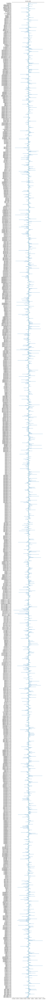

In [11]:
az.plot_forest(trace, var_names=["beta"], combined=True, hdi_prob=0.95, r_hat=False, rope=(0,0), textsize=8);
plt.tight_layout()

In [12]:
cutoff = 0.001
np.abs(summary['mean']).sort_values(ascending=False)[:20].index.values

array(['beta[SHTCVD19NM1_A_9.0]', 'beta[PAILLMB3M_A_8.0]',
       'beta[EQUIP_A_2.0]', 'beta[SPOUSWRK_A_8.0]',
       'beta[MILITARY_A_7.0]', 'beta[HOUTENURE_A_7.0]',
       'beta[SASPPRACE_A_2.0]', 'beta[EMPSICKLV_A_9.0]',
       'beta[HITLOOK_A_8.0]', 'beta[CHIP_A_9.0]', 'beta[HOUTENURE_A_2.0]',
       'beta[MARSTAT_A_3.0]', 'beta[PAIBACK3M_A_7.0]',
       'beta[MEDICAID_A_9.0]', 'beta[REPSTRAIN_A_2.0]',
       'beta[SHTPNUEV_A_2.0]', 'beta[AFVET_A_9.0]',
       'beta[TRANSPOR_A_8.0]', 'beta[SPOUSLIV_A_2.0]',
       'beta[VISIONDF_A_9.0]'], dtype=object)

In [13]:
import re
# extract top 20 features but drop duplicates
important = np.abs(summary['mean']).sort_values(ascending=False)[:20].index.values
important_feats = [re.search('\[(.+)_\d+\.0\]',idx).group(1) for idx in important]
# # preserve order
imporant_feats = list(dict.fromkeys(important_feats)) 

pattern = '|'.join(important_feats)
# # filter to keep only relevant features
X_train_new = X_train.filter(regex=pattern)
X_test_new = X_test.filter(regex=pattern)

# Simple model: three variables

First, I will start with a simplified model. Let $Y_i$ be the indicator variable showing whether individual $i$ self-reported long COVID.  I will start with only 3 predictors. 
$$
\begin{split}
\mathbf{x} & \in \mathbb{R}^k
\\ \\
Y_{i} & \sim \text{Bernoulli}(p_{i})
\\ \\
\text{logit}\:p_{i} &= \beta_{0} + \beta_1 \times \text{age} + \beta_2 \times \text{is male}  + \beta_k \times \text{got covid vaccine}
\\ \\
\end{split}
$$

In [14]:
X_train_s, X_test_s, y_train_s, y_test_s = preprocess_simple_model(df_full)

# Define PyMC model
with pm.Model() as simple_model:

    # LOGISTIC PRIORS
    b0 = pm.Normal('b0', mu=0, sigma=100)   
    b1 = pm.Normal('b1', mu=0, sigma=100)
    b2 = pm.Normal('b2', mu=0, sigma=100)
    b3 = pm.Normal('b3', mu=0, sigma=100)

    # predictors
    X = pm.Data("X", X_train_s.values)
    y = pm.Data("y", y_train_s)
    # calculate probability
    logitp = b0 + b1*X[:,0] + b2*X[:,1] + b3*X[:,2]
    theta = 1 / (1 + np.exp(-logitp))
    
    # LIKELIHOOD
    obs = pm.Bernoulli('obs',
                  p=theta,
                  observed=y) 

simple_model

Shape after feature selection and dropping lcovid nulls: (15291, 4)


 b0 ~ Normal(0, 100)
 b1 ~ Normal(0, 100)
 b2 ~ Normal(0, 100)
 b3 ~ Normal(0, 100)
obs ~ Bernoulli(f(b3, b2, b0, b1))

In [15]:
# run MCMC to get posterior distribution
# with simple_model:
#     idata_simple = pm.sample(draws=3000, # num samples to keep
#                              tune=1500, # num samples to throw away
#                              chains=4, # num initializations
#                              target_accept=0.90) 
with simple_model:
    idata_simple = pm.sample_smc()
    print(f'DONE')

Initializing SMC sampler...
Sampling 4 chains in 4 jobs


Output()

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


DONE


In [16]:
pm.summary(idata_simple)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,-1.441,0.087,-1.603,-1.275,0.001,0.001,8273.0,8072.0,1.0
b1,0.003,0.001,-0.000,0.005,0.000,0.000,7987.0,8202.0,1.0
b2,-0.460,0.052,-0.558,-0.363,0.001,0.000,8030.0,8143.0,1.0
b3,-0.240,0.061,-0.354,-0.127,0.001,0.000,7977.0,7702.0,1.0


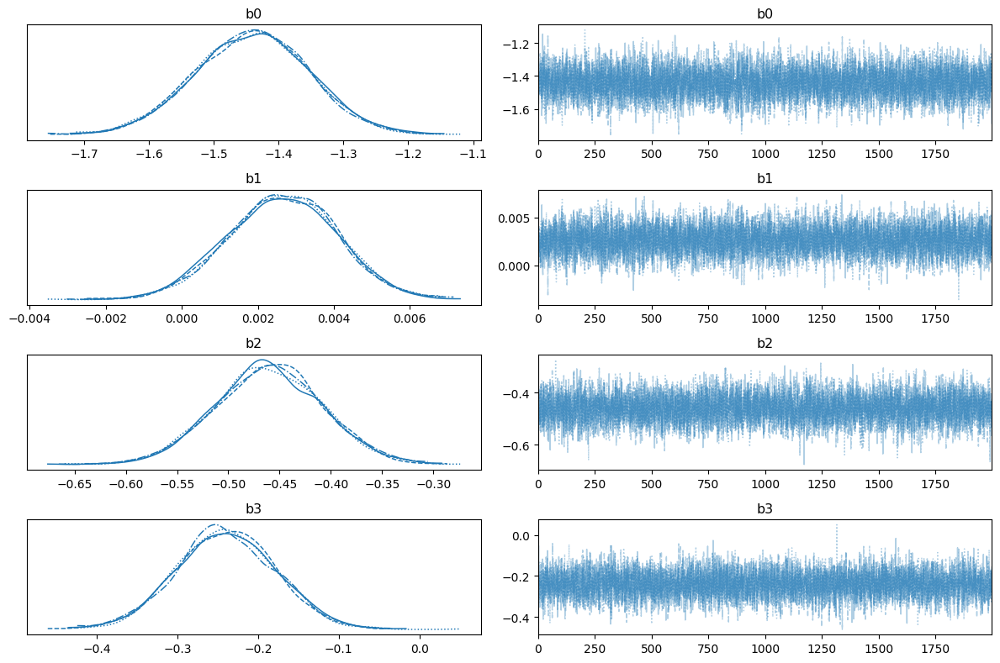

In [17]:
pm.plot_trace(idata_simple)
plt.tight_layout()
plt.show()

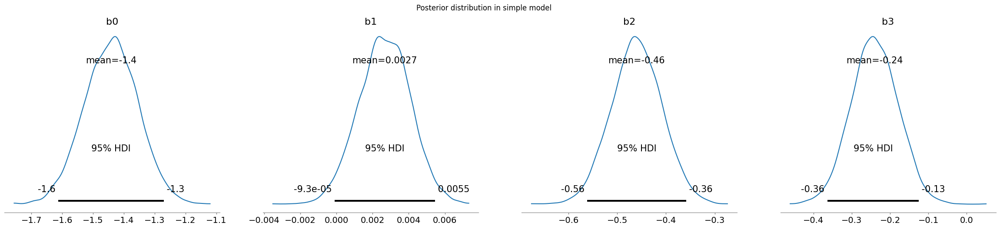

In [18]:
# plot posterior distributions
posterior_dict = {}
params = ["b0", "b1", "b2", "b3"]
for param in params:
    posterior_dict[param] = idata_simple.posterior[param].values

az.plot_posterior(posterior_dict, hdi_prob=0.95);
plt.suptitle("Posterior distribution in simple model")
plt.show()

### Evaluation on train set

https://www.pymc.io/projects/examples/en/latest/generalized_linear_models/GLM-out-of-sample-predictions.html

# Hierarchical Model: three variables

Model:
$$
\begin{split}
\mathbf{x} & \in \mathbb{R}^3
\\ \\
Y_{i} & \sim \text{Bernoulli}(p_{i})
\\ \\
\text{logit}\:p_{i} &= \beta_{0} + \beta_1 \times \text{age} + \beta_2 \times \text{is male}  + \beta_3 \times \text{got covid vaccine}
\end{split}
$$

Priors:
$$
\begin{split}
\beta_i & \sim \mathcal{N}(\mu_i, \sigma_i^2)
\\ \\
\mu_i & \sim \mathcal{N}(0, 10000) 
\\ \\
\frac{1}{\sigma_i^2} & \sim \mathrm{Gamma}(0.1, 0.1)
\\ \\
&\text{for }i  = 1, 2, 3
\end{split}
$$

In [21]:
with pm.Model() as hier_model:
    k = 4

    # HYPERPRIORS
    mu = pm.Normal('mu', mu=0, sigma=5)
    # tau = pm.Gamma('tau', alpha=0.1, beta=0.1)
    sigma = pm.HalfNormal('sigma', sigma=5)

    # LOGISTIC PRIORS
    b0 = pm.Normal('b0', mu=mu, sigma=sigma) #tau=tau)   
    b1 = pm.Normal('b1', mu=mu, sigma=sigma) #tau=tau)
    b2 = pm.Normal('b2', mu=mu, sigma=sigma) #tau=tau)
    b3 = pm.Normal('b3', mu=mu, sigma=sigma) #tau=tau)

    # predictors
    x = X_train.values
    # calculate probability
    logitp = b0 + b1*x[:,0] + b2*x[:,1] + b3*x[:,2]
    theta = 1 / (1 + np.exp(-logitp))
    
    # LIKELIHOOD
    y = pm.Bernoulli('y',
                  p=theta,
                  observed=y_train) 

In [22]:
hier_model

   mu ~ Normal(0, 5)
sigma ~ HalfNormal(0, 5)
   b0 ~ Normal(mu, sigma)
   b1 ~ Normal(mu, sigma)
   b2 ~ Normal(mu, sigma)
   b3 ~ Normal(mu, sigma)
    y ~ Bernoulli(f(b3, b2, b0, b1))

In [23]:
# run MCMC to get posterior distribution
with hier_model:
    idata_hier = pm.sample(draws=3000, # num samples to keep
                             tune=1500, # num samples to throw away
                             chains=4, # num initializations
                             target_accept=0.90) 
    print(f'DONE')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, b0, b1, b2, b3]


Output()

Sampling 4 chains for 1_500 tune and 3_000 draw iterations (6_000 + 12_000 draws total) took 20 seconds.


DONE


In [24]:
pm.summary(idata_hier, round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,-0.42,0.81,-2.00,1.17,0.01,0.01,6658.65,4350.80,1.0
b0,-1.67,0.03,-1.72,-1.63,0.00,0.00,11860.58,8544.53,1.0
b1,0.05,0.02,-0.00,0.09,0.00,0.00,11068.18,8673.77,1.0
b2,-0.00,0.02,-0.05,0.04,0.00,0.00,11828.80,9292.92,1.0
b3,-0.04,0.03,-0.09,0.01,0.00,0.00,11182.39,8075.68,1.0
sigma,1.47,0.98,0.38,3.12,0.01,0.01,6481.70,6155.28,1.0


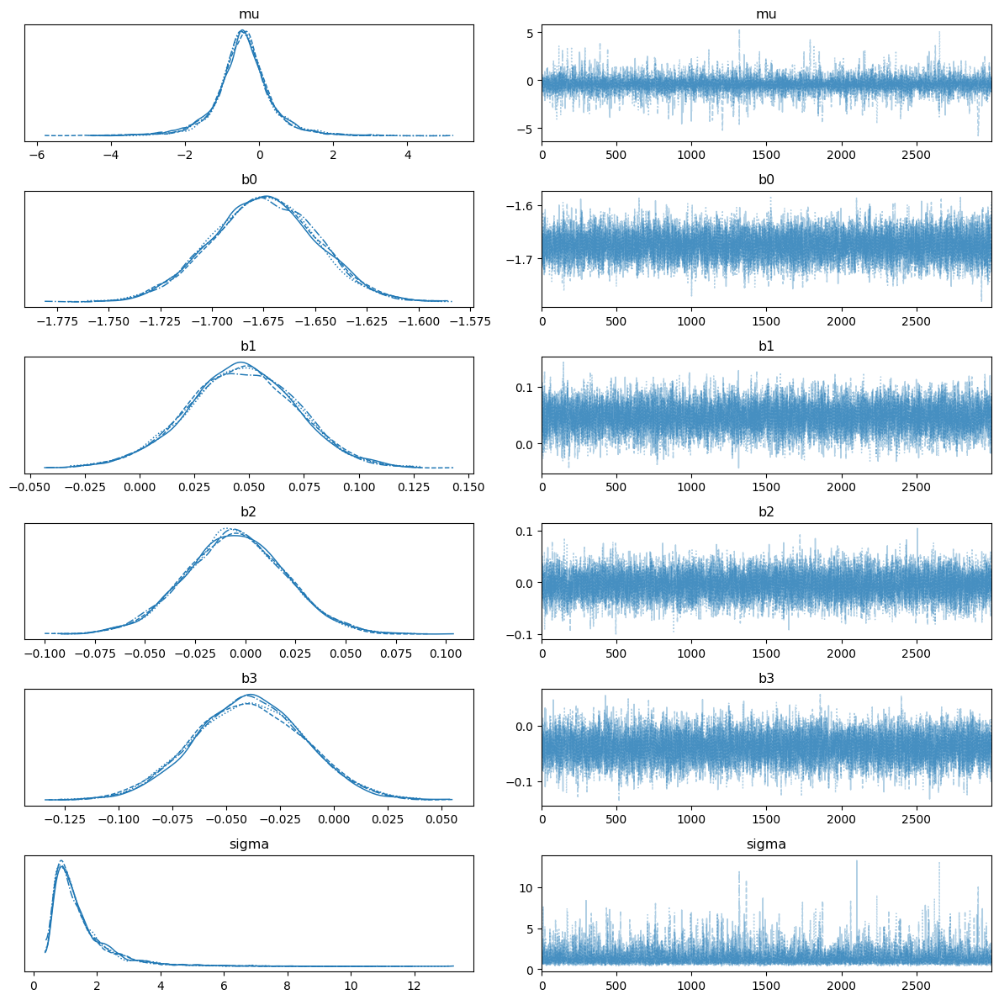

In [25]:
pm.plot_trace(idata_hier)
plt.tight_layout()
plt.show()

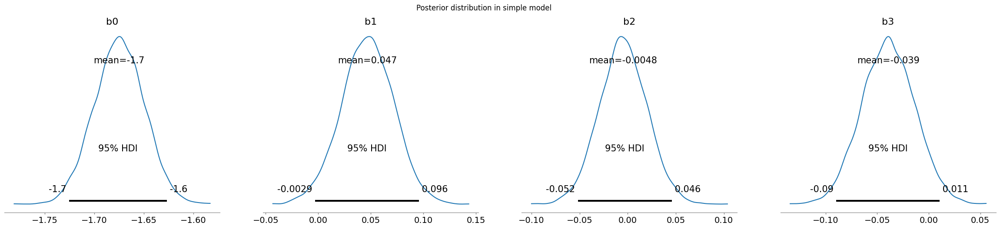

In [26]:
# plot posterior distributions
posterior_dict = {}
params = ["b0", "b1", "b2", "b3"]
for param in params:
    posterior_dict[param] = idata_hier.posterior[param].values

az.plot_posterior(posterior_dict, hdi_prob=0.95);
plt.suptitle("Posterior distribution in simple model")
plt.show()

# Features from literature
- female sex : "SEX_A"
- type 2 diabetes : "DIBEV_A" 
- increasing age : "AGEP_A"
- increasing BMI : "BMICAT_A"
- ADHD : closest is difficulty concentrating -> "COGMEMDFF_A"
- chronic hives : not present
- seasonal allergies : not present
- the presence of more than 5 symptoms during acute COVID-19 infection
- the role of the vaccine in providing protection against long COVID is unclear: some studies report a preventative effect, while others show no difference in disease prevalence
  - "SHTCVD191_A" : yes/no got covid vaccine
  - "SHTCVD19NM1_A" : number of covid vaccines
  - "SHOTTYPE2_A" : brand of first covid vaccine
- there are also reports of higher rates of long COVID among certain ethnicities, like those of Hispanic heritage.
  - "HISPALLP_A " : race where hipanic heritage is distinguished

In [27]:
## PREPROCESS LIT DATA AND CREATE MODEL
X_train_l, X_test_l, y_train_l, y_test_l = preprocess_lit_features(df_full)
# X_train_l, X_test_l, coords = add_int_create_coords(X_train_l, X_test_l)
coords = {"coeffs": X_train_l.columns}

with pm.Model(coords=coords) as lit_model:
    # data containers
    X = pm.Data("X", X_train_l)
    y = pm.Data("y", y_train_l)
    # priors
    b0 = pm.Normal("b0", 0, 100) # intercept: no shrinkage
    b = pm.Normal("b", mu=0, sigma=1, dims="coeffs")
    # linear model
    mu = b0 + pm.math.dot(X, b)
    # link function
    p = pm.Deterministic("p", pm.math.invlogit(mu))
    # likelihood
    pm.Bernoulli("obs", p=p, observed=y)
lit_model

  b ~ Normal(0, 1)
  p ~ Deterministic(f(b))
obs ~ Bernoulli(p)

In [29]:
## TMCMC SAMPLING: https://www.pymc.io/projects/examples/en/latest/samplers/SMC2_gaussians.html
with lit_model:
    idata_lit = pm.sample_smc()

Initializing SMC sampler...
Sampling 4 chains in 4 jobs


Output()

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [30]:
az.summary(idata_lit, var_names="b")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b[AGEP_A],0.013,0.028,-0.040,0.064,0.000,0.000,8200.0,7686.0,1.0
b[SEX_A_2],0.458,0.053,0.356,0.555,0.001,0.000,7961.0,7910.0,1.0
b[SEX_A_7],0.785,0.935,-0.894,2.624,0.010,0.007,8160.0,7928.0,1.0
b[SEX_A_9],-0.006,0.996,-1.905,1.863,0.011,0.008,8044.0,7757.0,1.0
b[DIBEV_A_2],-0.410,0.080,-0.552,-0.254,0.001,0.001,8124.0,7887.0,1.0
b[DIBEV_A_7],-0.684,0.798,-2.210,0.772,0.009,0.006,7648.0,7905.0,1.0
b[DIBEV_A_9],0.018,0.978,-1.851,1.828,0.011,0.008,8052.0,8143.0,1.0
b[BMICAT_A_2],-0.147,0.204,-0.526,0.240,0.002,0.002,7322.0,7413.0,1.0
b[BMICAT_A_3],0.050,0.205,-0.339,0.426,0.002,0.002,7561.0,7413.0,1.0
b[BMICAT_A_4],0.256,0.205,-0.127,0.637,0.002,0.002,7533.0,7528.0,1.0


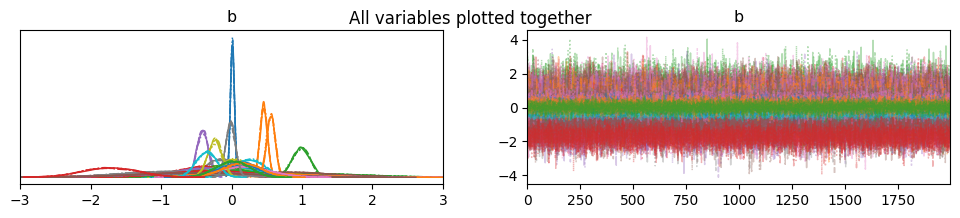

In [31]:
ax = az.plot_trace(idata_lit, var_names="b", compact=True);
ax[0][0].set_xlim([-3,3]);
plt.suptitle("All variables plotted together")
plt.show()

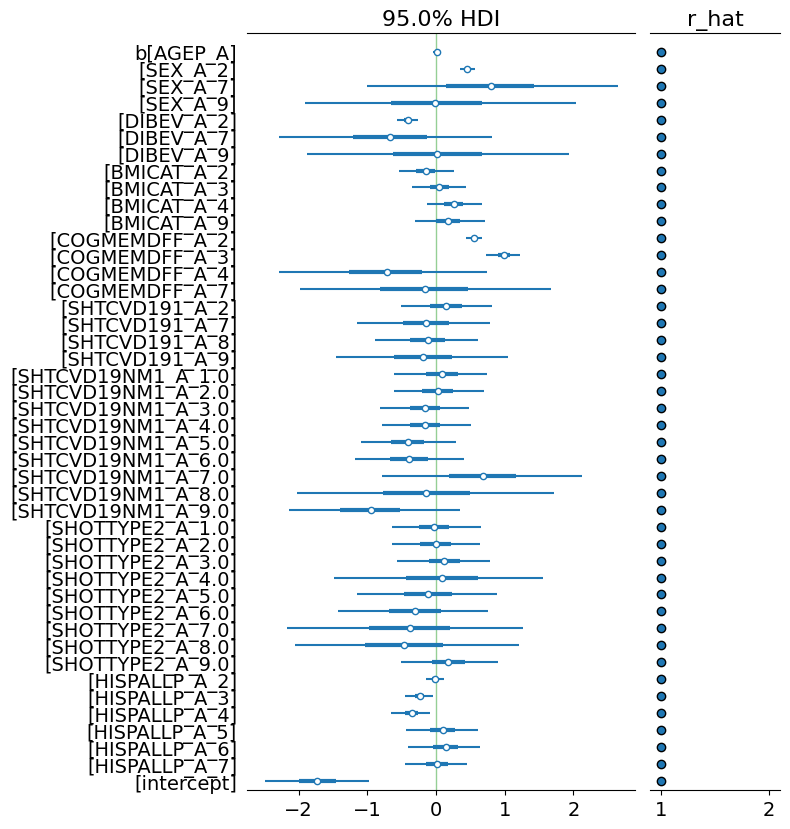

In [32]:
az.plot_forest(idata_lit, var_names=["b"], combined=True, hdi_prob=0.95, r_hat=True, rope=(0, 0));
plt.tight_layout()

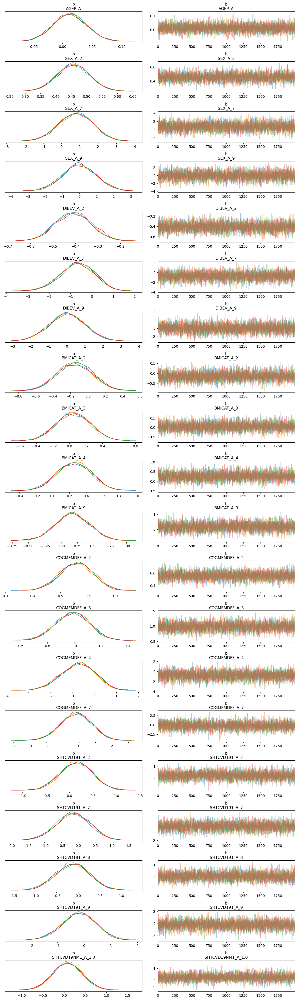

In [33]:
az.plot_trace(idata_lit, var_names=["b"], compact=False, coords={"coeffs": coords["coeffs"][:20]});
plt.tight_layout()

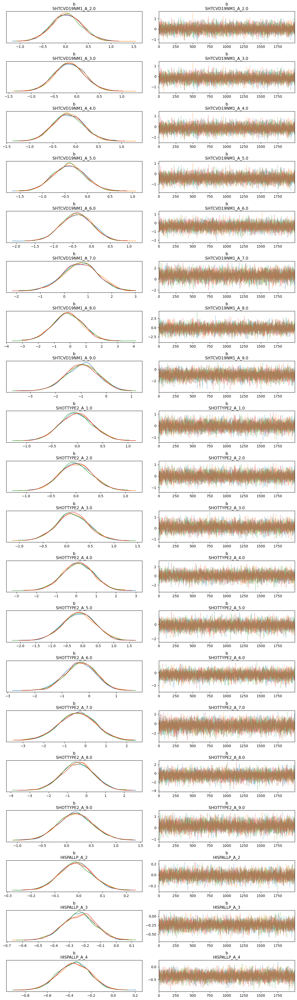

In [34]:
az.plot_trace(idata_lit, var_names=["b"], compact=False, coords={"coeffs": coords["coeffs"][20:40]});
plt.tight_layout()

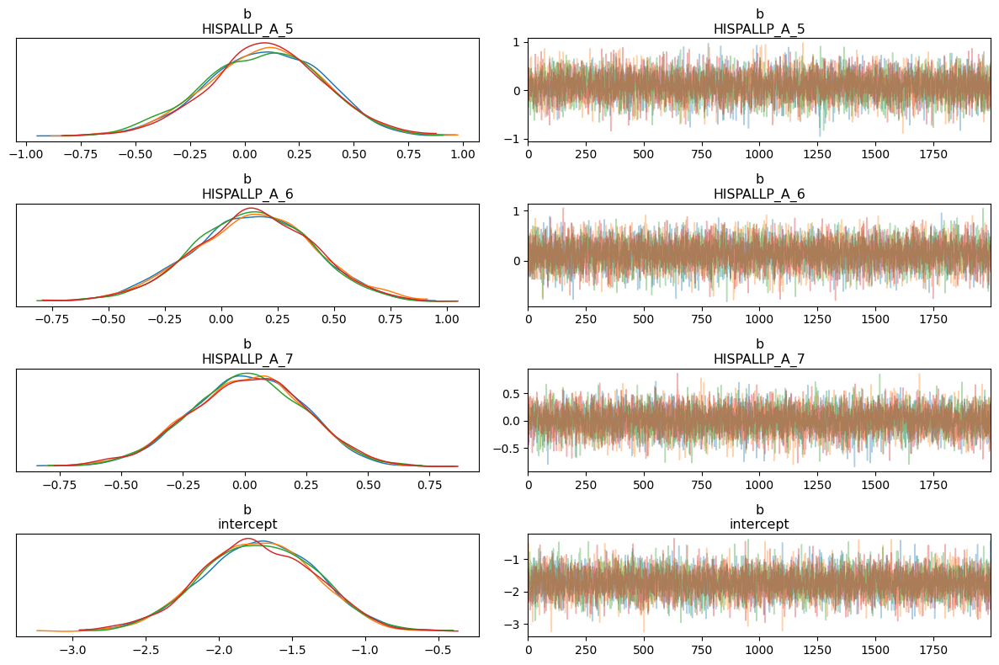

In [35]:
az.plot_trace(idata_lit, var_names=["b"], compact=False, coords={"coeffs": coords["coeffs"][40:44]});
plt.tight_layout()

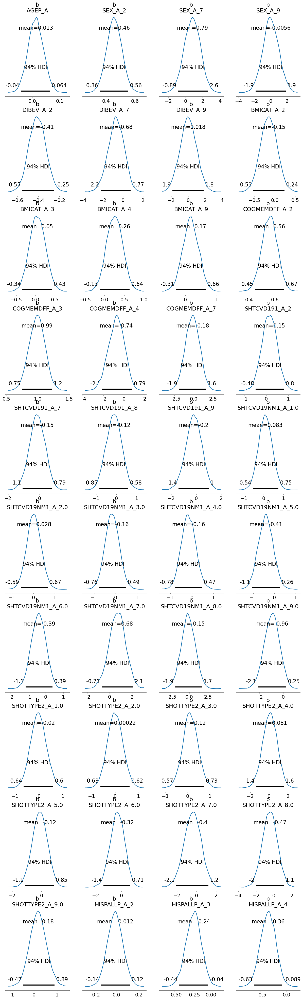

In [36]:
az.plot_posterior(
    idata_lit, var_names=["b"], figsize=(15, 50), coords={"coeffs": coords["coeffs"][:40]}
);

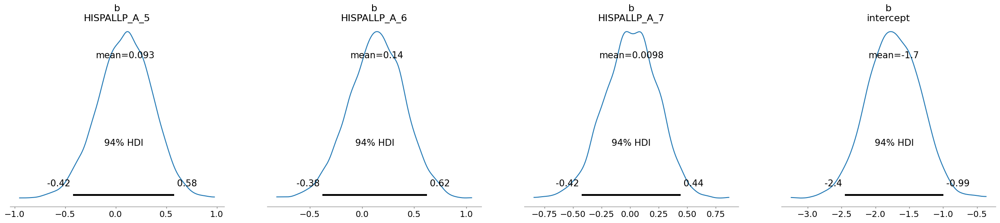

In [37]:
az.plot_posterior(
    idata_lit, var_names=["b"], coords={"coeffs": coords["coeffs"][40:]}
);

In [38]:
# bayes_factor = np.exp(
#     idata_lit.sample_stats["log_marginal_likelihood"].mean()
#     - idata_simple.sample_stats["log_marginal_likelihood"].mean()
# )
# np.round(bayes_factor).item()

In [39]:
# p_test_pred = idata_lit.posterior_predictive["obs"].mean(dim=["chain", "draw"])
# y_test_pred = (p_test_pred >= 0.5).astype("int").to_numpy()

# plot_roc(y_test, p_test_pred, title="ROC: Features From Literature")

# Hierarchical Lit Model

# After feature selection

In [40]:
from preprocessing import preprocess_after_bayes

In [82]:
# # https://pymc.io/projects/examples/en/latest/generalized_linear_models/GLM-out-of-sample-predictions.html
# coords = {"coeffs": labels}

# X_train_b, X_test_b, y_train_b, y_test_b = preprocess_after_bayes()
pattern = '|'.join(important_feats)
# # filter to keep only relevant features
X_train_b = X_train.filter(regex=pattern)
X_test_b = X_test.filter(regex=pattern)
y_train_b = y_train
y_test_b = y_test
# X_train_b, X_test_b, coords_b = add_int_create_coords(X_train_b, X_test_b)
coords_b = {"coeffs": X_train_b.columns}

with pm.Model(coords=coords_b) as bayes_model:
    # data containers
    X = pm.Data("X", X_train_b.values)
    y = pm.Data("y", y_train_b)
    # priors
    b0 = pm.Normal("b0", 0, 100) # intercept: no shrinkage
    b = pm.Normal("b", mu=0, sigma=1, dims="coeffs")
    # linear model
    mu = b0 + pm.math.dot(X, b)
    # link function
    p = pm.Deterministic("p", pm.math.invlogit(mu))
    # likelihood
    pm.Bernoulli("obs", p=p, observed=y)
bayes_model

 b0 ~ Normal(0, 100)
  b ~ Normal(0, 1)
  p ~ Deterministic(f(b, b0))
obs ~ Bernoulli(p)

In [42]:
# TMCMC SAMPLING: https://www.pymc.io/projects/examples/en/latest/samplers/SMC2_gaussians.html
with bayes_model:
    idata_bayes = pm.sample_smc()

Initializing SMC sampler...
Sampling 4 chains in 4 jobs


Output()

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (83), generating only 20 plots
  warnings.warn(


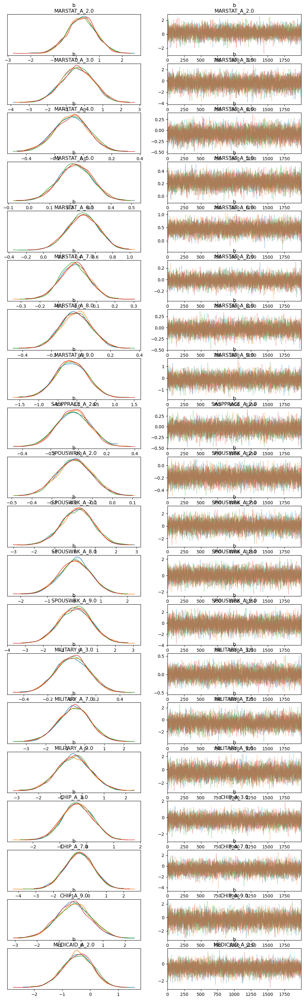

In [43]:
az.plot_trace(idata_bayes, var_names="b", compact=False);

In [44]:
az.summary(idata_bayes, var_names="b")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b[MARSTAT_A_2.0],0.232,0.623,-0.935,1.403,0.007,0.005,8210.0,7592.0,1.0
b[MARSTAT_A_3.0],-0.393,0.877,-2.014,1.268,0.010,0.007,7737.0,7648.0,1.0
b[MARSTAT_A_4.0],-0.081,0.120,-0.312,0.140,0.001,0.001,7928.0,7397.0,1.0
b[MARSTAT_A_5.0],0.226,0.082,0.072,0.379,0.001,0.001,7787.0,7850.0,1.0
b[MARSTAT_A_6.0],0.460,0.181,0.099,0.774,0.002,0.001,7914.0,7652.0,1.0
...,...,...,...,...,...,...,...,...,...
b[VISIONDF_A_3.0],0.632,0.188,0.271,0.974,0.002,0.002,7832.0,7931.0,1.0
b[VISIONDF_A_4.0],0.945,0.683,-0.324,2.222,0.008,0.005,8135.0,7804.0,1.0
b[VISIONDF_A_7.0],0.601,0.925,-1.096,2.371,0.010,0.008,7812.0,7685.0,1.0
b[VISIONDF_A_9.0],-0.137,0.926,-1.867,1.610,0.010,0.007,8004.0,7889.0,1.0


/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (83) in plot_posterior, generating only 40 plots
  warnings.warn(


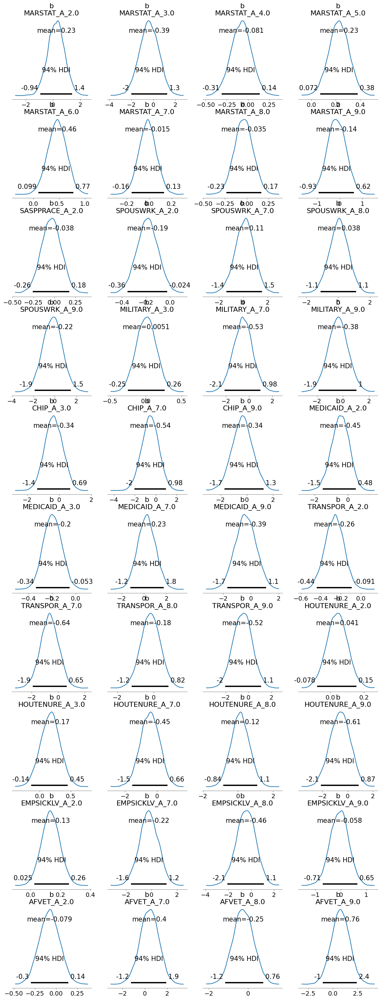

In [45]:
az.plot_posterior(
    idata_bayes, var_names=["b"], figsize=(15, 40)
);

In [ ]:
az.plot_forest(idata_bayes, var_names=["b"], combined=True, hdi_prob=0.95, r_hat=True, rope=(0, 0));
plt.tight_layout()

In [46]:
# ## EVALUATE
# with bayes_model:
#     pm.set_data({"X": X_test_b.values, "y": y_test_b})
#     idata_bayes.extend(pm.sample_posterior_predictive(idata_bayes))

In [47]:
# p_test_pred_b = idata_bayes.posterior_predictive["obs"].mean(dim=["chain", "draw"])
# y_test_pred_b = (p_test_pred_b >= 0.5).astype("int").to_numpy()
# print(f"accuracy = {np.mean(y_test_b==y_test_pred_b): 0.3f}")
# plot_roc(y_test_b, p_test_pred_b, title="ROC: Model with features selected from sparsity enforcing prior")

# Hierarchical model using features after bayesian feature selection


Model:
$$
\begin{split}
\mathbf{x} & \in \mathbb{R}^k
\\ \\
Y_{i} & \sim \text{Bernoulli}(p_{i})
\\ \\
\text{logit}\:p_{i} &= \beta_{0} + \beta_1 x_1 + \beta_2 x_2  + \dots + \beta_k x_k
\end{split}
$$

Priors:
$$
\begin{split}
\beta_i & \sim \mathcal{N}(\mu_i, \sigma_i^2)
\\ \\
\mu_i & \sim \mathcal{N}(0, 10000) 
\\ \\
\frac{1}{\sigma_i^2} & \sim \mathrm{Gamma}(0.1, 0.1)
\\ \\
&\text{for }i  = 1, 2, 3
\end{split}
$$

In [61]:
X_train_b

,MARSTAT_A_2.0,MARSTAT_A_3.0,MARSTAT_A_4.0,MARSTAT_A_5.0,MARSTAT_A_6.0,MARSTAT_A_7.0,MARSTAT_A_8.0,MARSTAT_A_9.0,SASPPRACE_A_2.0,SPOUSWRK_A_2.0,...,HITLOOK_A_8.0,HITLOOK_A_9.0,EQUIP_A_2.0,EQUIP_A_7.0,VISIONDF_A_2.0,VISIONDF_A_3.0,VISIONDF_A_4.0,VISIONDF_A_7.0,VISIONDF_A_9.0,intercept
24600,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2427,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9890,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
10664,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5882,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15292,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
16961,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
11460,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12463,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [105]:

with pm.Model(coords=coords_b) as hier_model:
    # data containers
    X = pm.Data("X", X_train_b.values)
    y = pm.Data("y", y_train_b)

    mu = 0

    # No shrinkage on intercept
    b0 = pm.Normal("beta0", 0, 100)

    mu += b0 # add intercept

    # Loop through each feature prefix
    for prefix in set(important_feats):
        # Identify column indices matching the prefix
        cols_in_group = [i for i, col in enumerate(X_train_b.columns) if col.startswith(prefix)]

        X_group = X[:, cols_in_group]

        # Define shared hyperpriors for the group
        group_mu = pm.Normal(f"{prefix}_mu", mu=0, sigma=1)
        group_sigma = pm.HalfNormal(f"{prefix}_sigma", sigma=2) ## INCREASED SIGMA

        # Group-level coefficients
        group_b = pm.Normal(f"b_{prefix}", mu=group_mu, sigma=group_sigma, shape=len(cols_in_group))

        mu += pm.math.dot(X_group, group_b)

    # link function
    p = pm.Deterministic("p", pm.math.invlogit(mu))
    # likelihood
    pm.Bernoulli("obs", p=p, observed=y)
hier_model

              beta0 ~ Normal(0, 100)
   SHTCVD19NM1_A_mu ~ Normal(0, 1)
SHTCVD19NM1_A_sigma ~ HalfNormal(0, 2)
    b_SHTCVD19NM1_A ~ Normal(SHTCVD19NM1_A_mu, SHTCVD19NM1_A_sigma)
     REPSTRAIN_A_mu ~ Normal(0, 1)
  REPSTRAIN_A_sigma ~ HalfNormal(0, 2)
      b_REPSTRAIN_A ~ Normal(REPSTRAIN_A_mu, REPSTRAIN_A_sigma)
      MILITARY_A_mu ~ Normal(0, 1)
   MILITARY_A_sigma ~ HalfNormal(0, 2)
       b_MILITARY_A ~ Normal(MILITARY_A_mu, MILITARY_A_sigma)
      TRANSPOR_A_mu ~ Normal(0, 1)
   TRANSPOR_A_sigma ~ HalfNormal(0, 2)
       b_TRANSPOR_A ~ Normal(TRANSPOR_A_mu, TRANSPOR_A_sigma)
      MEDICAID_A_mu ~ Normal(0, 1)
   MEDICAID_A_sigma ~ HalfNormal(0, 2)
       b_MEDICAID_A ~ Normal(MEDICAID_A_mu, MEDICAID_A_sigma)
         AFVET_A_mu ~ Normal(0, 1)
      AFVET_A_sigma ~ HalfNormal(0, 2)
          b_AFVET_A ~ Normal(AFVET_A_mu, AFVET_A_sigma)
     EMPSICKLV_A_mu ~ Normal(0, 1)
  EMPSICKLV_A_sigma ~ HalfNormal(0, 2)
      b_EMPSICKLV_A ~ Normal(EMPSICKLV_A_mu, EMPSICKLV_A_sigma)
     PA

In [106]:
with hier_model:
    idata_hier = pm.sample_smc()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta0, SHTCVD19NM1_A_mu, SHTCVD19NM1_A_sigma, b_SHTCVD19NM1_A, REPSTRAIN_A_mu, REPSTRAIN_A_sigma, b_REPSTRAIN_A, MILITARY_A_mu, MILITARY_A_sigma, b_MILITARY_A, TRANSPOR_A_mu, TRANSPOR_A_sigma, b_TRANSPOR_A, MEDICAID_A_mu, MEDICAID_A_sigma, b_MEDICAID_A, AFVET_A_mu, AFVET_A_sigma, b_AFVET_A, EMPSICKLV_A_mu, EMPSICKLV_A_sigma, b_EMPSICKLV_A, PAILLMB3M_A_mu, PAILLMB3M_A_sigma, b_PAILLMB3M_A, SHTPNUEV_A_mu, SHTPNUEV_A_sigma, b_SHTPNUEV_A, HOUTENURE_A_mu, HOUTENURE_A_sigma, b_HOUTENURE_A, CHIP_A_mu, CHIP_A_sigma, b_CHIP_A, SPOUSLIV_A_mu, SPOUSLIV_A_sigma, b_SPOUSLIV_A, SASPPRACE_A_mu, SASPPRACE_A_sigma, b_SASPPRACE_A, PAIBACK3M_A_mu, PAIBACK3M_A_sigma, b_PAIBACK3M_A, EQUIP_A_mu, EQUIP_A_sigma, b_EQUIP_A, MARSTAT_A_mu, MARSTAT_A_sigma, b_MARSTAT_A, VISIONDF_A_mu, VISIONDF_A_sigma, b_VISIONDF_A, HITLOOK_A_mu, HITLOOK_A_sigma, b_HITLOOK_A, SPOUSWRK_A_mu, SPOUSWRK_A_sigm

Output()

EOFError: 

In [ ]:
az.plot_trace(idata_hier, compact=False);

In [88]:
az.summary(idata_hier, var_names='b_', filter_vars="like")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b_SHTCVD19NM1_A[0],0.078,0.152,-0.202,0.342,0.058,0.043,7.0,36.0,1.55
b_SHTCVD19NM1_A[1],-0.049,0.145,-0.311,0.214,0.055,0.040,7.0,34.0,1.53
b_SHTCVD19NM1_A[2],-0.221,0.167,-0.517,0.091,0.062,0.046,8.0,30.0,1.45
b_SHTCVD19NM1_A[3],-0.412,0.217,-0.837,-0.054,0.091,0.068,6.0,30.0,1.73
b_SHTCVD19NM1_A[4],-0.209,0.324,-0.747,0.339,0.143,0.107,6.0,33.0,1.94
...,...,...,...,...,...,...,...,...,...
b_HITLOOK_A[3],-0.118,0.310,-0.655,0.426,0.117,0.086,7.0,49.0,1.49
b_SPOUSWRK_A[0],-0.151,0.091,-0.326,0.010,0.022,0.016,17.0,99.0,1.15
b_SPOUSWRK_A[1],0.149,0.439,-0.659,0.864,0.196,0.147,5.0,29.0,2.02
b_SPOUSWRK_A[2],0.327,0.613,-0.560,1.394,0.289,0.219,5.0,29.0,2.06


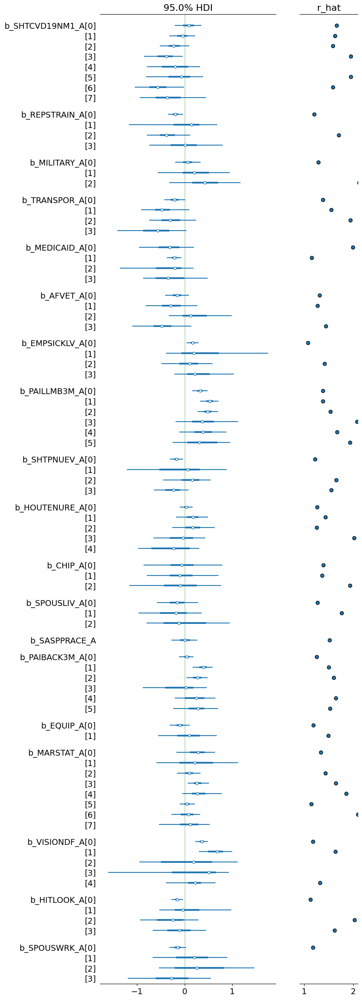

In [89]:
az.plot_forest(idata_hier, var_names='b_', filter_vars="like", combined=True, hdi_prob=0.95, r_hat=True, rope=(0, 0));

# Model Selection
- Bayes factor compares models

In [64]:
simple_log_likelihood = idata_simple.sample_stats["log_marginal_likelihood"].mean()
lit_log_likelihood = idata_lit.sample_stats["log_marginal_likelihood"].mean()

bayes_factor = np.exp(
    lit_log_likelihood
    - simple_log_likelihood
)
np.round(bayes_factor).item()

8.858522385862781e+43

In [67]:
# https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/model_comparison.html
# with simple_model:
#     pm.compute_log_likelihood(idata_simple)

In [69]:
# with lit_model:
#     pm.compute_log_likelihood(idata_lit)

In [70]:
# with bayes_model:
#     pm.compute_log_likelihood(idata_bayes)

In [107]:
simple_log_likelihood = idata_simple.log_likelihood['obs'].mean(dim=["chain", "draw"]).sum()
lit_log_likelihood = idata_lit.log_likelihood['obs'].mean(dim=["chain", "draw"]).sum()
bayes_log_likelihood = idata_bayes.log_likelihood['obs'].mean(dim=["chain", "draw"]).sum()

# Simple vs literature
bayes_factor_sl = np.exp(
    lit_log_likelihood
    - simple_log_likelihood
)
bayes_factor_sl =np.round(bayes_factor_sl).item()

# Simple vs bayes
bayes_factor_sb = np.exp(
    bayes_log_likelihood
    - simple_log_likelihood
)
bayes_factor_sb =np.round(bayes_factor_sb).item()

# Literature vs bayes
bayes_factor_lb = np.exp(
    bayes_log_likelihood
    - lit_log_likelihood
)
bayes_factor_lb =np.round(bayes_factor_lb).item()

In [111]:
print(np.log(bayes_factor_sl))
print(np.log(bayes_factor_sb))
print(np.log(bayes_factor_lb))

124.20592719779779
267.1320196072029
142.9260924094051


In [74]:
az.waic(idata_lit)

/Users/katherinehunter/Active_projects/AM207_project/.venv/lib/python3.11/site-packages/arviz/stats/stats.py:1653: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 8000 posterior samples and 12232 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -5157.70    67.80
p_waic       30.56        -

There has been a warning during the calculation. Please check the results.

In [75]:
az.waic(idata_simple)

Computed from 8000 posterior samples and 12232 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -5268.32    67.60
p_waic        3.98        -

In [ ]:
# Leave-one-out 

simple_loo = az.loo(idata_simple)

simple_loo

# Evaluation with test set
- use posterior to predict, then compute accuracy with test set
- compute AUC curves 

In [76]:
## EVALUATE: FIX THE X_TRAIN VALUES
with simple_model:
    pm.set_data({"X": X_test_s.values, "y": y_test_s})
    idata_simple.extend(pm.sample_posterior_predictive(idata_simple))

with lit_model:
    pm.set_data({"X": X_test_l.values, "y": y_test_l})
    idata_lit.extend(pm.sample_posterior_predictive(idata_lit))

with bayes_model:
    pm.set_data({"X": X_test_b.values, "y": y_test_b})
    idata_bayes.extend(pm.sample_posterior_predictive(idata_bayes))

with hier_model:
    pm.set_data({"X": X_test_b.values, "y": y_test_b})
    idata_hier.extend(pm.sample_posterior_predictive(idata_hier))

Sampling: [obs]


Output()

Sampling: [obs]


Output()

Sampling: [obs]


Output()

Sampling: [obs]


Output()

In [90]:
with hier_model:
    pm.set_data({"X": X_test_b.values, "y": y_test_b})
    idata_hier.extend(pm.sample_posterior_predictive(idata_hier))

Sampling: [obs]


Output()

accuracy =  0.843


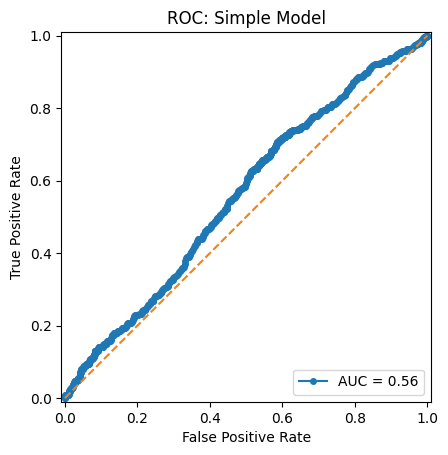

In [78]:
p_test_pred_s = idata_simple.posterior_predictive["obs"].mean(dim=["chain", "draw"])
y_test_pred_s = (p_test_pred_s >= 0.5).astype("int").to_numpy()
print(f"accuracy = {np.mean(y_test_s==y_test_pred_s): 0.3f}")
plot_roc(y_test_s, p_test_pred_s, title="ROC: Simple Model")

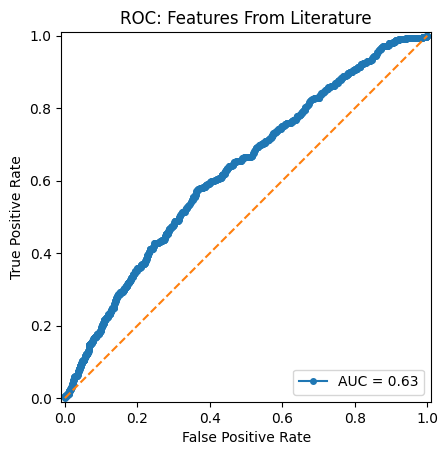

In [79]:
# ROC for LIT model
p_test_pred_l = idata_lit.posterior_predictive["obs"].mean(dim=["chain", "draw"])
y_test_pred_l = (p_test_pred_l >= 0.5).astype("int").to_numpy()

plot_roc(y_test_l, p_test_pred_l, title="ROC: Features From Literature")

accuracy =  0.842


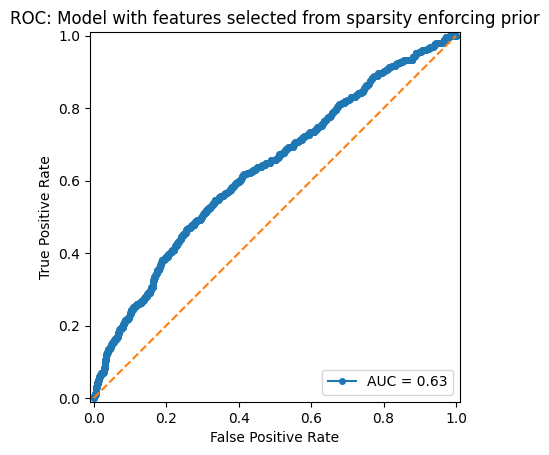

In [80]:
# ROC for Bayes model
p_test_pred_b = idata_bayes.posterior_predictive["obs"].mean(dim=["chain", "draw"])
y_test_pred_b = (p_test_pred_b >= 0.5).astype("int").to_numpy()
print(f"accuracy = {np.mean(y_test_b==y_test_pred_b): 0.3f}")
plot_roc(y_test_b, p_test_pred_b, title="ROC: Model with features selected from sparsity enforcing prior")

accuracy =  0.842


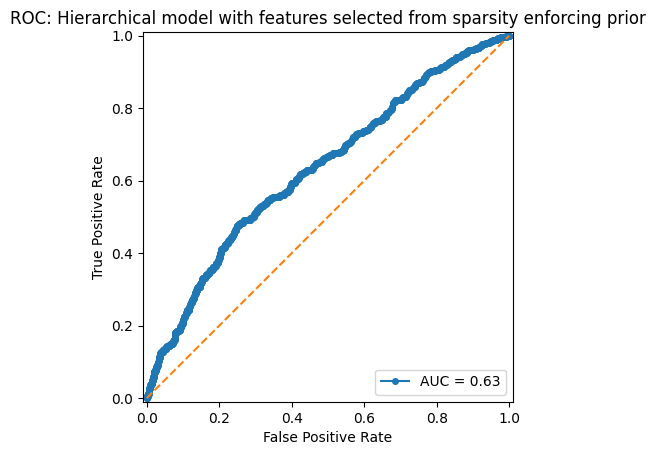

In [91]:
# ROC for Hier model
p_test_pred_h = idata_hier.posterior_predictive["obs"].mean(dim=["chain", "draw"])
y_test_pred_h = (p_test_pred_h >= 0.5).astype("int").to_numpy()
print(f"accuracy = {np.mean(y_test_b==y_test_pred_h): 0.3f}")
plot_roc(y_test_b, p_test_pred_h, title="ROC: Hierarchical model with features selected from sparsity enforcing prior")